In [1]:
import numpy as np
import os
import json
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.regularizers import l2
from tensorflow.keras.metrics import Precision, Recall, AUC, Accuracy
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.utils import to_categorical
from skimage.io import imread, imshow, imsave
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
#from roboflow import Roboflow
os.environ['CUDA_VISIBLE_DEVICES'] = '0' 

2024-10-08 04:33:45.995272: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-08 04:33:46.038834: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-08 04:33:46.038871: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-08 04:33:46.040038: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-08 04:33:46.047788: I tensorflow/core/platform/cpu_feature_guar

In [2]:
annotation_path = 'Object_detection-1/train/_annotations.coco.json'
image_path = 'Object_detection-1/train/'

images = []
labels = []
bboxes = []

In [3]:
with open(annotation_path) as f:
    data = json.load(f)

In [4]:
for annotations in data['annotations']:
    image_id = annotations['image_id']
    image_info = next(item for item in data['images'] if item['id'] == image_id)
    image_name = image_info['file_name']
    img_path = os.path.join(image_path, image_name)
    
    if os.path.exists(img_path):
        image = load_img(img_path, target_size=(224, 224))
        image = img_to_array(image)
        image = image.astype('float32') / 255

        bbox = annotations['bbox']
        label = annotations['category_id']

        images.append(image)
        labels.append(label)
        bboxes.append(bbox)

In [5]:
print(labels)

[6, 6, 1, 7, 2, 5, 5, 10, 9, 2, 8, 2, 2, 2, 2, 10, 10, 6, 9, 2, 2, 4, 5, 10, 10, 2, 1, 5, 3, 3, 7, 2, 1, 12, 11, 2, 2, 9, 3, 6, 6, 12, 7, 8, 3, 3, 3, 9, 3, 3, 9, 10, 3, 3, 5, 4, 7, 2, 7, 5, 5, 12, 3, 10, 10, 9, 3, 3, 1, 3, 8, 8, 10, 12, 11, 4, 6, 6, 5, 4, 5, 5, 2, 12, 4, 5, 10, 5, 10, 3, 10, 10, 11, 2, 2, 9, 12, 6, 6, 12, 12, 8, 8, 7, 6, 6, 4, 5, 8, 3, 10, 12, 2, 11, 9, 7, 2, 12, 7, 9, 3, 3, 8, 2, 8, 7, 11, 9, 4, 5, 12, 12, 6, 6, 5, 4, 2, 7, 5, 11, 4, 5, 6, 6, 6, 6, 10, 2, 12, 5, 4, 3, 3, 11, 9, 9, 3, 3, 9, 7, 5, 5, 12, 2, 10, 3, 10, 2, 8, 3, 5, 5, 5, 5, 7, 5, 5, 4, 5, 7, 6, 6, 6, 6, 5, 11, 3, 7, 3, 1, 6, 9, 12, 10, 8, 8, 11, 9, 5, 5, 3, 10, 3, 2, 8, 2, 9, 3, 3, 9, 5, 12, 4, 9, 1, 3, 5, 12, 11, 11, 5, 11, 3, 7, 7, 5, 5, 3, 3, 10, 3, 2, 5, 11, 3, 3, 9, 1, 3, 6, 6, 6, 6, 3, 10, 2, 9, 3, 3, 9, 3, 3, 7, 10, 5, 5, 7, 10, 9, 10, 2, 5, 12, 11, 11, 7, 4, 5, 12, 7, 12, 7, 6, 6, 6, 6, 12, 3, 9, 4, 5, 3, 1, 4, 5, 3, 2, 12, 7, 5, 12, 11, 11, 2, 8, 5, 3, 9, 7, 10, 3, 12, 11, 4, 5, 12, 4, 6, 6, 6, 6

In [6]:
label_map = {0: 'Lab-images', 1: 'Battery', 2: 'Bottle', 3: 'Chair', 4: 'Door', 5: 'Door Knob', 6: 'Posters', 7: 'Socket', 8: 'Storage Box', 9: 'Table', 10: 'carboard box', 11: 'cupboard', 12: 'dustbin'}
labels = [label_map[label] for label in labels]

In [7]:
print(labels)

['Posters', 'Posters', 'Battery', 'Socket', 'Bottle', 'Door Knob', 'Door Knob', 'carboard box', 'Table', 'Bottle', 'Storage Box', 'Bottle', 'Bottle', 'Bottle', 'Bottle', 'carboard box', 'carboard box', 'Posters', 'Table', 'Bottle', 'Bottle', 'Door', 'Door Knob', 'carboard box', 'carboard box', 'Bottle', 'Battery', 'Door Knob', 'Chair', 'Chair', 'Socket', 'Bottle', 'Battery', 'dustbin', 'cupboard', 'Bottle', 'Bottle', 'Table', 'Chair', 'Posters', 'Posters', 'dustbin', 'Socket', 'Storage Box', 'Chair', 'Chair', 'Chair', 'Table', 'Chair', 'Chair', 'Table', 'carboard box', 'Chair', 'Chair', 'Door Knob', 'Door', 'Socket', 'Bottle', 'Socket', 'Door Knob', 'Door Knob', 'dustbin', 'Chair', 'carboard box', 'carboard box', 'Table', 'Chair', 'Chair', 'Battery', 'Chair', 'Storage Box', 'Storage Box', 'carboard box', 'dustbin', 'cupboard', 'Door', 'Posters', 'Posters', 'Door Knob', 'Door', 'Door Knob', 'Door Knob', 'Bottle', 'dustbin', 'Door', 'Door Knob', 'carboard box', 'Door Knob', 'carboard box

In [8]:
images = np.array(images)
bboxes = np.array(bboxes)
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)


In [9]:
np.save('labels.npy', label_encoder.classes_)

In [10]:
print(labels)

[ 5  5  0  6  1  4  4  9  8  1  7  1  1  1  1  9  9  5  8  1  1  3  4  9
  9  1  0  4  2  2  6  1  0 11 10  1  1  8  2  5  5 11  6  7  2  2  2  8
  2  2  8  9  2  2  4  3  6  1  6  4  4 11  2  9  9  8  2  2  0  2  7  7
  9 11 10  3  5  5  4  3  4  4  1 11  3  4  9  4  9  2  9  9 10  1  1  8
 11  5  5 11 11  7  7  6  5  5  3  4  7  2  9 11  1 10  8  6  1 11  6  8
  2  2  7  1  7  6 10  8  3  4 11 11  5  5  4  3  1  6  4 10  3  4  5  5
  5  5  9  1 11  4  3  2  2 10  8  8  2  2  8  6  4  4 11  1  9  2  9  1
  7  2  4  4  4  4  6  4  4  3  4  6  5  5  5  5  4 10  2  6  2  0  5  8
 11  9  7  7 10  8  4  4  2  9  2  1  7  1  8  2  2  8  4 11  3  8  0  2
  4 11 10 10  4 10  2  6  6  4  4  2  2  9  2  1  4 10  2  2  8  0  2  5
  5  5  5  2  9  1  8  2  2  8  2  2  6  9  4  4  6  9  8  9  1  4 11 10
 10  6  3  4 11  6 11  6  5  5  5  5 11  2  8  3  4  2  0  3  4  2  1 11
  6  4 11 10 10  1  7  4  2  8  6  9  2 11 10  3  4 11  3  5  5  5  5  1
  9 11  3  9  2  2  9  6  9  8  0  2  1  7  2  2  5

In [11]:
labels = to_categorical(labels, num_classes=12)

In [12]:
print(labels)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [13]:
X_train, X_temp, y_train, y_temp, bbox_train, bbox_temp = train_test_split(images, labels, bboxes, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test, bbox_val, bbox_test = train_test_split(X_temp, y_temp, bbox_temp, test_size=0.5, random_state=42)

In [14]:
input_shape = (224, 224, 3)
num_classes = len(label_encoder.classes_)
reg = l2(0.0005)

In [15]:
print(num_classes)

12


In [16]:
def create_model(input_shape, num_classes, reg):

    base_model = MobileNetV2(input_shape = input_shape, include_top = False, weights='imagenet')
    for layers in base_model.layers:
        layers.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)

    bbox_out = Dense(4, activation = 'linear', name = 'bbox_output')(x)
    class_out = Dense(num_classes, activation = 'softmax', name = 'class_output')(x)

    model = Model(inputs = base_model.input, outputs = [bbox_out, class_out])

    model.compile(optimizer = Adam(learning_rate = 0.0001),
                  loss = {'bbox_output': 'mean_squared_error', 'class_output': 'categorical_crossentropy'},
                  metrics = {'bbox_output': 'mse', 'class_output': 'accuracy'})
    model.summary()

    return model
    

In [17]:
model = create_model(input_shape, num_classes, reg)

2024-10-08 04:33:50.966406: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-10-08 04:33:51.006480: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-10-08 04:33:51.006652: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

In [18]:
history = model.fit(X_train, 
                    {'bbox_output': bbox_train, 'class_output': y_train},
                    validation_data=(X_val, {'bbox_output': bbox_val, 'class_output': y_val}),
                    batch_size=20, 
                    epochs=150, 
                    verbose=1, 
                    callbacks=[ModelCheckpoint('bbox_.keras', save_best_only=True)])


Epoch 1/150


2024-10-08 04:34:06.487185: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-10-08 04:34:10.175739: I external/local_xla/xla/service/service.cc:168] XLA service 0x7ff000004450 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-10-08 04:34:10.175784: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): GRID A100D-40C, Compute Capability 8.0
2024-10-08 04:34:10.210339: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1728354850.408829  297332 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


37/37 [==============================] - 12s 60ms/step - loss: 88810.5156 - bbox_output_loss: 88807.4219 - class_output_loss: 3.1084 - bbox_output_mse: 88807.4219 - class_output_accuracy: 0.0789 - val_loss: 82594.5078 - val_bbox_output_loss: 82591.9297 - val_class_output_loss: 2.5744 - val_bbox_output_mse: 82591.9297 - val_class_output_accuracy: 0.1556
Epoch 2/150
37/37 [==============================] - 1s 28ms/step - loss: 79046.8984 - bbox_output_loss: 79042.5078 - class_output_loss: 4.3738 - bbox_output_mse: 79042.5078 - class_output_accuracy: 0.1122 - val_loss: 71192.7812 - val_bbox_output_loss: 71190.1875 - val_class_output_loss: 2.5870 - val_bbox_output_mse: 71190.1875 - val_class_output_accuracy: 0.1333
Epoch 3/150
37/37 [==============================] - 1s 28ms/step - loss: 66692.7734 - bbox_output_loss: 66686.4688 - class_output_loss: 6.2847 - bbox_output_mse: 66686.4688 - class_output_accuracy: 0.1094 - val_loss: 58321.6562 - val_bbox_output_loss: 58318.9648 - val_class_out

In [19]:
predicitons = model.predict(X_test)
predicitons = np.argmax(predicitons[1], axis=1)
predicitons = label_encoder.inverse_transform(predicitons)

3/3 [==============================] - 1s 27ms/step


In [20]:
predictions = predicitons 
images = X_test
num_images = len(predictions)
num_cols = 5
num_rows = (num_images // num_cols) + 1
fig, axes = plt.subplots(num_rows, num_cols, figsize=(100, 100))  
axes = axes.flatten()
for i, (prediction, image) in enumerate(zip(predictions, images)):
    ax = axes[i]
    ax.imshow(image, aspect='equal')
    ax.set_title(prediction)
    ax.axis('off')

plt.show()

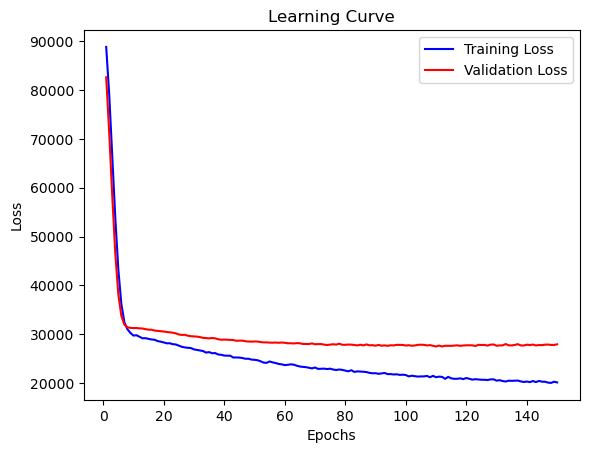

In [21]:
train_loss = history.history['loss']
epochs = range(1, len(train_loss) + 1)
val_loss = history.history['val_loss']
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()